# HDF5 Frame Explorer

Open a local or NAS-mounted `.h5` file, inspect its contents, browse frames with a slider, and apply a custom processing pipeline.

**Workflow**
1. Set `FILE_PATH` in the *Configuration* cell and run all cells.
2. **Section 1** prints the dataset structure, frame count, and total size — no pixel data loaded.
3. **Section 2** displays a single frame by index — edit `FRAME_INDEX` and re-run.
4. **Section 3** lets you define a custom processing pipeline and visualise the result on that frame.
5. **Section 4** loads a frame range and opens an interactive slider.

## Imports

In [1]:
import inspect
from pathlib import Path
import numpy as np

from pd_xray.data import HDF5Reader
from pd_xray.processing import ImageProcessor
from pd_xray.visualisation import view_frames, apply_and_view, view_histogram

## Configuration

Edit the variables below before running the rest of the notebook.

> **NAS / NFS mounts** — set `FILE_PATH` to the mounted path (e.g. `/mnt/nas/data/scan.h5` on Linux or `/Volumes/nas/data/scan.h5` on macOS). No backend wiring is needed: the OS presents the mount as a regular directory.

In [2]:
# ── File location ─────────────────────────────────────────────────────────
FILE_PATH    = Path("/Volumes/u1/1-sharedSolidification/MG39628_h5/mg39628_1_0102_widefov_000000.h5")   # local path or NAS mount point
DATASET_PATH = None   # None = auto-detect; or set explicitly e.g. "/entry/data/data"

# ── Display ───────────────────────────────────────────────────────────────
CMAP = "gray"

## 1 · Inspect file

Reports all datasets in the file (shape, dtype, size) and summarises the active dataset. **No pixel data is loaded.**

In [3]:
reader = HDF5Reader()

# ── Dataset inventory ─────────────────────────────────────────────────────
structure = reader.inspect(FILE_PATH)
print("Datasets in file:")
for ds, info in structure["datasets"].items():
    size_mb = np.prod(info["shape"]) * np.dtype(info["dtype"]).itemsize / 1024**2
    print(f"  {ds:<50}  shape={info['shape']}  dtype={info['dtype']}  ({size_mb:.1f} MB)")

# ── Active dataset summary ────────────────────────────────────────────────
header   = reader.read_header(FILE_PATH, dataset_path=DATASET_PATH)
n_frames = header["n_frames"]
shape    = header["shape"]
dtype    = header["dtype"]
frame_kb = int(np.prod(shape[-2:])) * np.dtype(dtype).itemsize / 1024
total_mb = frame_kb * n_frames / 1024

print(f"\nActive dataset : {header['dataset_path']}")
print(f"Full shape     : {shape}")
print(f"Frames         : {n_frames:,}")
print(f"Frame size     : {shape[-2]} × {shape[-1]} px  ({frame_kb:.1f} KB each)")
print(f"Total data     : {total_mb:.1f} MB  ({total_mb / 1024:.2f} GB)")

Datasets in file:
  /widefov                                            shape=(734, 2304, 4096)  dtype=uint16  (13212.0 MB)

Active dataset : /widefov
Full shape     : (734, 2304, 4096)
Frames         : 734
Frame size     : 2304 × 4096 px  (18432.0 KB each)
Total data     : 13212.0 MB  (12.90 GB)


## 2 · Single frame

Change `FRAME_INDEX` to any value between `0` and `n_frames - 1` and re-run the cell. Only that one frame is read from disk.

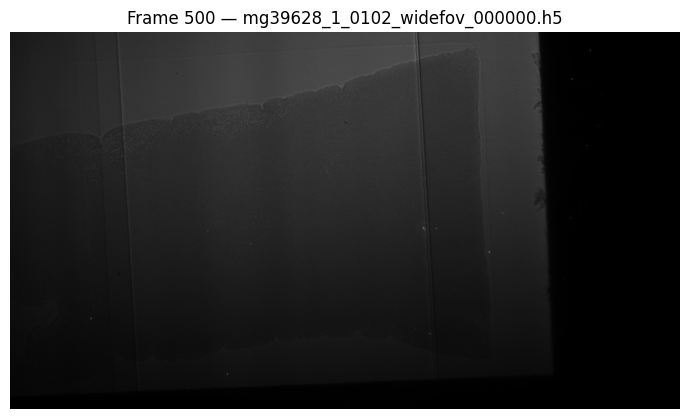

In [4]:
# ── Choose your frame ─────────────────────────────────────────────────────
FRAME_INDEX = 500   # ← edit me

arr   = reader.lazy_read(FILE_PATH, dataset_path=DATASET_PATH)
frame = arr[FRAME_INDEX]   # only this frame is read from disk

view_frames(frame, title=f"Frame {FRAME_INDEX} — {FILE_PATH.name}", cmap=CMAP)

## 2.5 · Frame histogram

Plot the pixel-intensity distribution of the frame loaded above. Adjust `bins`, `percentile_markers`, or set `log_scale=True` to better reveal the dynamic range.

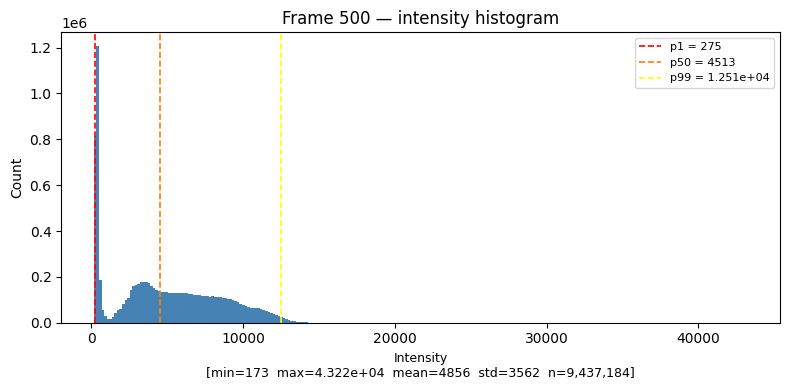

In [5]:
view_histogram(
    frame,
    title=f"Frame {FRAME_INDEX} — intensity histogram",
    bins=256,
    percentile_markers=(1.0, 50.0, 99.0),
    log_scale=False,
)

## 3 · Custom processing recipe

Build a pipeline by chaining steps on `ImageProcessor`. Run the first cell to see all available operations and define `step_help()`, then edit the recipe cell below.

`apply_and_view` applies the recipe to `frame` from Section 2 and opens the image viewer. The returned array `processed` holds the result and can be inspected or saved.

In [6]:
def step_help(step_name: str) -> None:
    """Print the signature and docstring for a named processing step."""
    public_method = getattr(ImageProcessor, step_name, None)
    if public_method is None:
        print(f"Unknown step: {step_name!r}")
        print(f"Available: {', '.join(ImageProcessor.available_steps())}")
        return

    # Signature without 'self'
    sig    = inspect.signature(public_method)
    params = list(sig.parameters.values())[1:]   # drop 'self'
    print(f"ImageProcessor.{step_name}{sig.replace(parameters=params)}")

    # One-line summary from the public fluent method
    summary = inspect.getdoc(public_method)
    if summary:
        print(f"\n{summary}")

    # Detailed Args / Returns from the private implementation
    private_name   = ImageProcessor._DISPATCH.get(step_name)
    private_method = getattr(ImageProcessor, private_name, None) if private_name else None
    if private_method:
        detail = inspect.getdoc(private_method)
        if detail and detail != summary:
            print(f"\n{detail}")


print("Available processing steps:")
for step in ImageProcessor.available_steps():
    print(f"  {step}")

Available processing steps:
  gaussian_blur
  median_filter
  bilateral_filter
  rolling_ball
  erode
  dilate
  open
  close
  fill_holes
  remove_small_objects
  remove_small_holes
  normalise
  clip
  clahe
  rescale_intensity
  rotate
  crop
  resize
  circular_mask
  cylindrical_mask
  extract_segmented_class
  flat_dark_field_correction
  log_transform
  local_contrast_enhancement
  flip


In [7]:
# ── Get help on any step — replace the name and re-run ────────────────────
step_help("flip")

ImageProcessor.flip(horizontal: bool = False, vertical: bool = False, dtype: Union[numpy.dtype[Any], NoneType, type[Any], numpy._typing._dtype_like._SupportsDType[numpy.dtype[Any]], str, tuple[Any, int], tuple[Any, Union[SupportsIndex, collections.abc.Sequence[SupportsIndex]]], list[Any], numpy._typing._dtype_like._DTypeDict, tuple[Any, Any]] = None) -> 'ImageProcessor'

Flip the image horizontally, vertically, or both.

Args:
    horizontal: Mirror left-right (along the vertical axis).
    vertical:   Mirror top-bottom (along the horizontal axis).
    dtype:      Optional output dtype.

Flip the image horizontally, vertically, or both.

For 3D arrays the flip is applied across all Z-slices simultaneously
(no per-slice loop needed since np.flip broadcasts over the Z axis).

Args:
    image      : Input 2D or 3D array.
    horizontal : If True, mirror left-right (flip along axis=-1 / columns).
    vertical   : If True, mirror top-bottom (flip along axis=-2 / rows).

Returns:
    Flipped

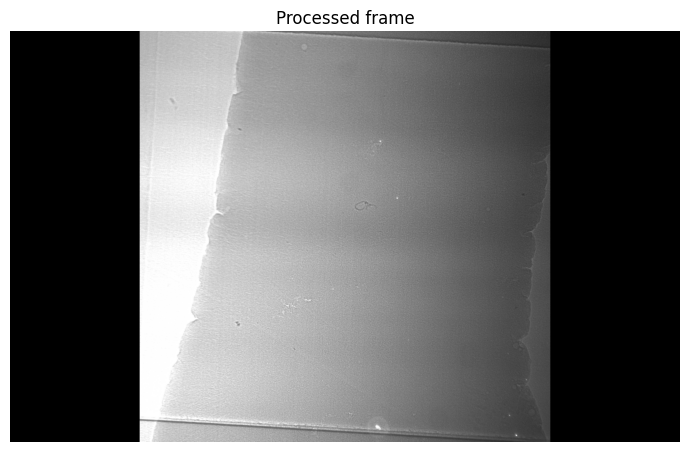

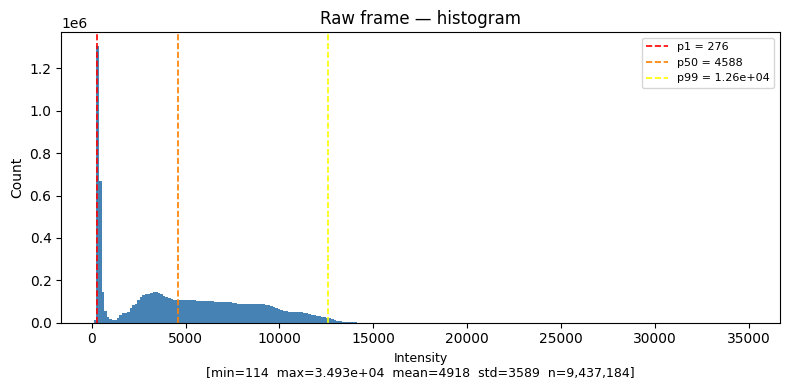

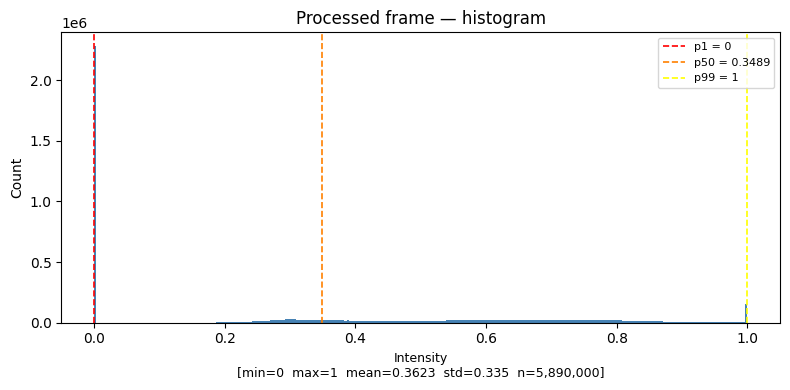

In [8]:
# ── Choose your frame ─────────────────────────────────────────────────────
FRAME_INDEX = 10   # ← edit me

arr   = reader.lazy_read(FILE_PATH, dataset_path=DATASET_PATH)
frame = arr[FRAME_INDEX]   # only this frame is read from disk

# ── Define your processing pipeline ───────────────────────────────────────
# Absolute mode (default): vmin/vmax are raw pixel values (e.g. 0–65535 for uint16).
# Percentile mode: pass percentile=(lower_pct, upper_pct) — effective clip values are printed.
proc1 = (
    ImageProcessor()
    .crop(100, 2000, 100, 3200)   # crop to (x_start, x_end, y_start, y_end)
    #.rescale_intensity(vmin=000,vmax=12000)
    #.rescale_intensity(percentile=(2, 98))   # ← swap to .rescale_intensity(vmin=0, vmax=65535) for absolute
)
proc2 = (
    ImageProcessor()
    .crop(100, 2000, 100, 3200)   # crop to (x_start, x_end, y_start, y_end)
    .rotate (-90)   # rotate by angle (degrees, counter-clockwise)
    .flip("horizontal")   # flip "horizontal" or "vertical"
    .rescale_intensity(vmin=0000,vmax=12000)
    #.rescale_intensity(percentile=(2, 98))   # ← swap to .rescale_intensity(vmin=0, vmax=65535) for absolute
)

# Apply and visualise
processed = apply_and_view(frame, proc2, title="Processed frame", cmap=CMAP)

# Before / after histogram comparison
view_histogram(frame,     title="Raw frame — histogram",       bins=256, percentile_markers=(1, 50, 99))
view_histogram(processed, title="Processed frame — histogram", bins=256, percentile_markers=(1, 50, 99))

## 4 · Frame slider

Loads a contiguous range of frames and opens an interactive slider to scan through them.

> **Large files** — `view_frames` pre-renders all frames into the widget. Keep the range to ≤ 100–200 frames for a responsive slider. Use `STEP > 1` to subsample (e.g. every 5th frame).


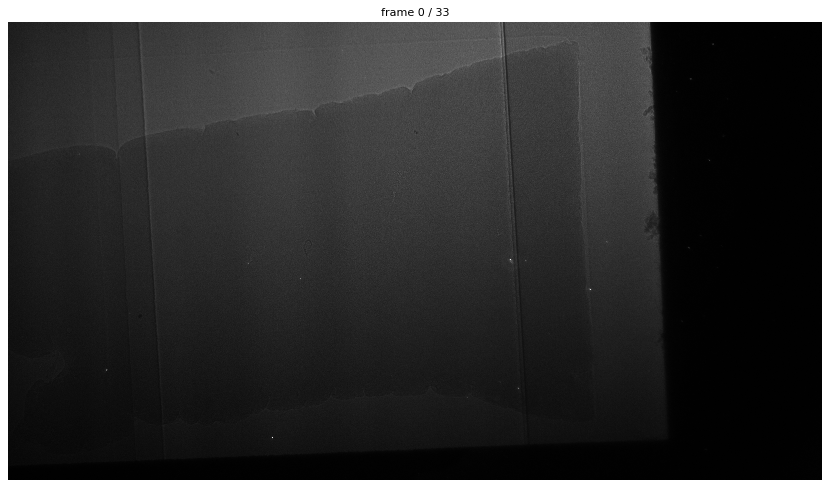

In [15]:
# ── Choose the frame range to browse ──────────────────────────────────────
START_FRAME = 200
END_FRAME   = 300   # exclusive — adjust to taste
STEP        =  3   # set > 1 to subsample (e.g. every 5th frame)

arr     = reader.lazy_read(FILE_PATH, dataset_path=DATASET_PATH)
section = arr[START_FRAME:END_FRAME:STEP]   # only this slice is read from disk

# ── Define your processing recipe ─────────────────────────────────────────
# Applied to all frames before the slider is rendered.
# Remove or comment out steps you don't need.
proc = (
    ImageProcessor()
    .crop(1000, 1000, 1500, 1700)
    .rotate(-90)
    .flip(horizontal=True)
    .rescale_intensity(vmin=1000, vmax=10000)
)

frames = proc(section) if proc.steps else section

view_frames(
    frames,
    title=f"{FILE_PATH.name}  ·  frames {START_FRAME}–{END_FRAME - 1} (step {STEP})",
    cmap=CMAP,
)